# Plant Disease Classification

Dataset credits: https://data.mendeley.com/datasets/tywbtsjrjv/1

### Import all the Dependencies

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.models import load_model

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight

import os


### Set Up Parameters

In [2]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS=40


These lines define several parameters:

- BATCH_SIZE: The number of training examples utilized in one iteration.
- IMAGE_SIZE: Height and width of the images that will be fed into the model.
- CHANNELS: Number of color channels in the images (3 for RGB).
- EPOCHS: The number of times the learning algorithm will work through the entire training dataset.

### Load and Prepare the Dataset

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "C:/Users/Sulani/Jupyter notebooks/plant-disease/training/with_augmentation",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 10000 files belonging to 10 classes.


This code loads image data from a specified directory (C:/Users/Sulani/Jupyter notebooks/plant-disease/training/with_augmentation). It configures the dataset for training:

- `seed` for random number generation, ensuring reproducibility.
- `shuffle=True` to mix up the dataset entries.


### Retrieve and Display Class Names

In [4]:
class_names=dataset.class_names
class_names

['Corn___Common_rust',
 'Corn___Gray_leaf_spot',
 'Corn___Northern_Leaf_Blight',
 'Corn___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Unknown___Unexpected_input']

In [5]:
# Calculate the Class Counts
class_counts = {}
for images, labels in dataset.as_numpy_iterator():
    for label in labels:
        class_label = class_names[label]
        if class_label in class_counts:
            class_counts[class_label] += 1
        else:
            class_counts[class_label] = 1

# Output the counts
for class_name in class_names:
    count = class_counts.get(class_name, 0)  # default to 0 if not found
    print(f"{count} images -> Class {class_name}")


1000 images -> Class Corn___Common_rust
1000 images -> Class Corn___Gray_leaf_spot
1000 images -> Class Corn___Northern_Leaf_Blight
1000 images -> Class Corn___healthy
1000 images -> Class Potato___Early_blight
1000 images -> Class Potato___Late_blight
1000 images -> Class Potato___healthy
1000 images -> Class Strawberry___Leaf_scorch
1000 images -> Class Strawberry___healthy
1000 images -> Class Unknown___Unexpected_input


### Class Distribution

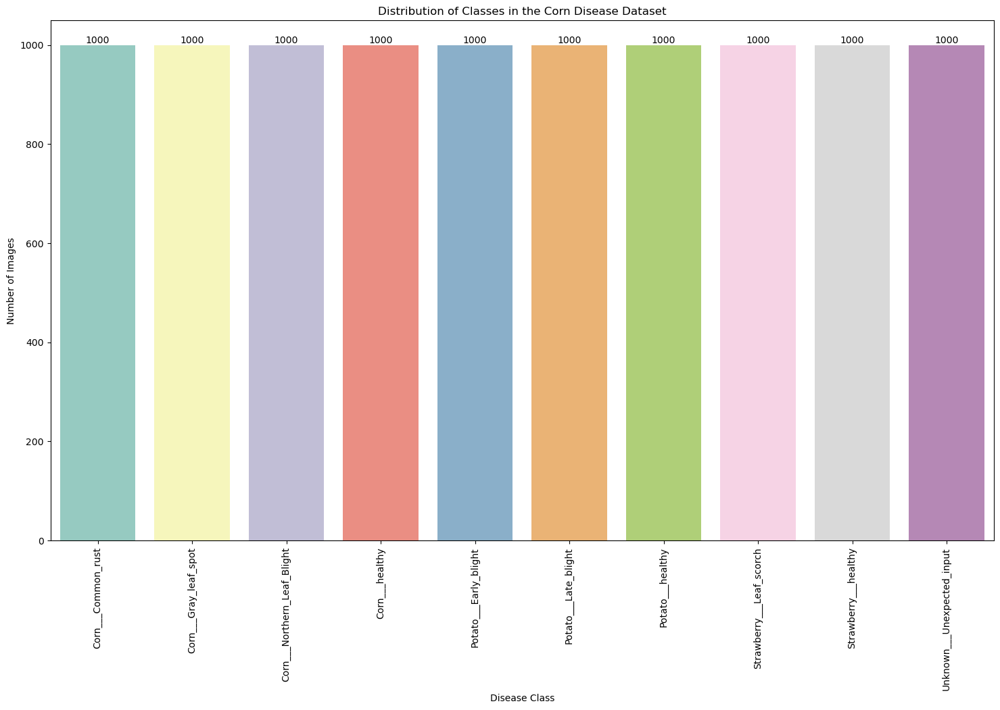

In [6]:
# Collect the counts per class as a list
counts = [class_counts.get(class_name, 0) for class_name in class_names]

# Now, create the DataFrame
data = pd.DataFrame({
    'Class Name': class_names,
    'Count': counts
})

# Create a bar plot using the DataFrame
plt.figure(figsize=(18, 10))
sns.barplot(x='Class Name', y='Count', data=data, palette="Set3")

# Adding labels and title
plt.title('Distribution of Classes in the Corn Disease Dataset')
plt.xlabel('Disease Class')
plt.ylabel('Number of Images')

# Adding text labels above bars for better readability
for i in data.index:
    plt.text(i, data['Count'][i], str(data['Count'][i]), ha='center', va='bottom')

plt.xticks(rotation=90)  # Rotate class names for better visibility
plt.show()


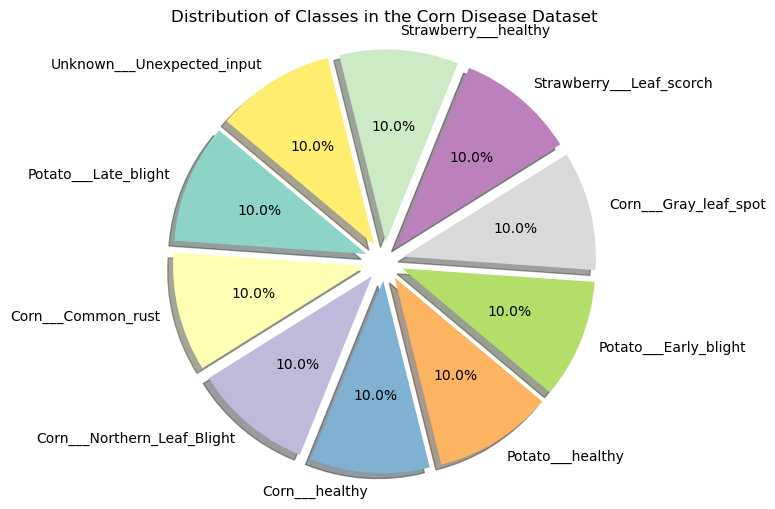

In [7]:
# Labels for the sections of our pie chart
labels = class_counts.keys()

# The values are the counts of each class
sizes = class_counts.values()

# Setting up the colors for each section of the pie
colors = plt.cm.Set3(np.linspace(0, 1, len(labels)))

# Exploding the 1st slice (optional, to highlight it)
explode = [0.1 if i == max(sizes) else 0 for i in sizes]

# Plotting the pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Adding a title
plt.title('Distribution of Classes in the Corn Disease Dataset')

# Show the plot
plt.show()

### Pixel Statistics

In [8]:
def get_pixel_stats(dataset, class_names):
    class_pixel_data = {name: [] for name in class_names}  # Dictionary to store pixel data for each class

    # Iterate through each batch and label
    for images, labels in dataset.as_numpy_iterator():
        for image, label in zip(images, labels):
            class_label = class_names[label]
            class_pixel_data[class_label].append(image.flatten())  # Flatten and store pixel data directly

    # Calculate mean and std dev for each class
    pixel_stats = {}
    for class_name, pixels in class_pixel_data.items():
        pixels = np.concatenate(pixels)  # Combine all pixels into a single array
        mean = np.mean(pixels)
        std = np.std(pixels)
        pixel_stats[class_name] = (mean, std)

    return pixel_stats

# Run the function and print results
pixel_stats = get_pixel_stats(dataset, class_names)
for class_name, stats in pixel_stats.items():
    print(f"Mean: {stats[0]:.2f}, Std Dev: {stats[1]:.2f} -> {class_name} ")


Mean: 85.35, Std Dev: 65.00 -> Corn___Common_rust 
Mean: 110.79, Std Dev: 43.47 -> Corn___Gray_leaf_spot 
Mean: 111.66, Std Dev: 39.05 -> Corn___Northern_Leaf_Blight 
Mean: 136.90, Std Dev: 50.05 -> Corn___healthy 
Mean: 130.29, Std Dev: 54.13 -> Potato___Early_blight 
Mean: 113.08, Std Dev: 45.70 -> Potato___Late_blight 
Mean: 112.37, Std Dev: 46.65 -> Potato___healthy 
Mean: 134.17, Std Dev: 53.38 -> Strawberry___Leaf_scorch 
Mean: 112.48, Std Dev: 51.69 -> Strawberry___healthy 
Mean: 117.31, Std Dev: 55.64 -> Unknown___Unexpected_input 


### Pixel Histograms

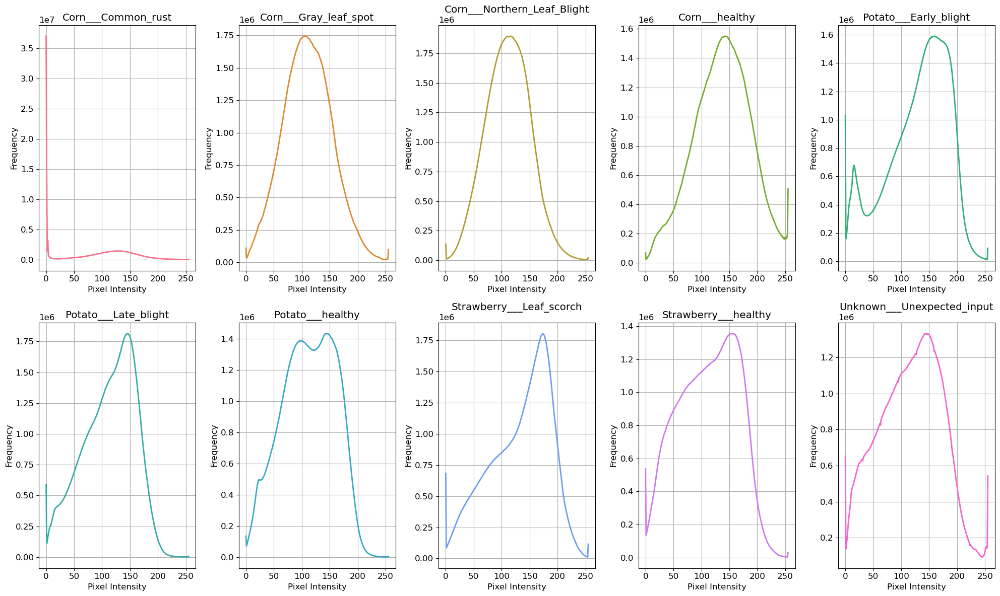

In [9]:
def plot_pixel_histograms_efficient(dataset, class_names):
    # Set a larger font size and style
    plt.rcParams.update({'font.size': 12, 'font.family': 'sans-serif'})

    # Ensure we have exactly 10 axes (for 5x4 layout)
    assert len(class_names) == 10, "This layout is configured for exactly 9 classes."

    # Choose a color palette
    colors = sns.color_palette('husl', n_colors=len(class_names))

    # Create subplots in a 5x5 grid
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 12))
    axes = axes.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

    # Initialize histograms
    hist_data = {name: np.zeros(256) for name in class_names}
    for images, labels in dataset.as_numpy_iterator():
        for image, label in zip(images, labels):
            class_label = class_names[label]
            pixels = image.flatten()
            counts, _ = np.histogram(pixels, bins=256, range=(0, 255))
            hist_data[class_label] += counts

    # Plot histograms using line plots
    for ax, (class_name, counts), color in zip(axes, hist_data.items(), colors):
        ax.plot(range(256), counts, color=color, linewidth=2)  # Using line plot for smoother appearance
        ax.set_title(f'{class_name}')
        ax.set_xlabel('Pixel Intensity')
        ax.set_ylabel('Frequency')
        ax.grid(True)  # Add grid for better readability

    plt.tight_layout()
    plt.show()

# Run the function to plot histograms
plot_pixel_histograms_efficient(dataset, class_names)


### Image Dimensions

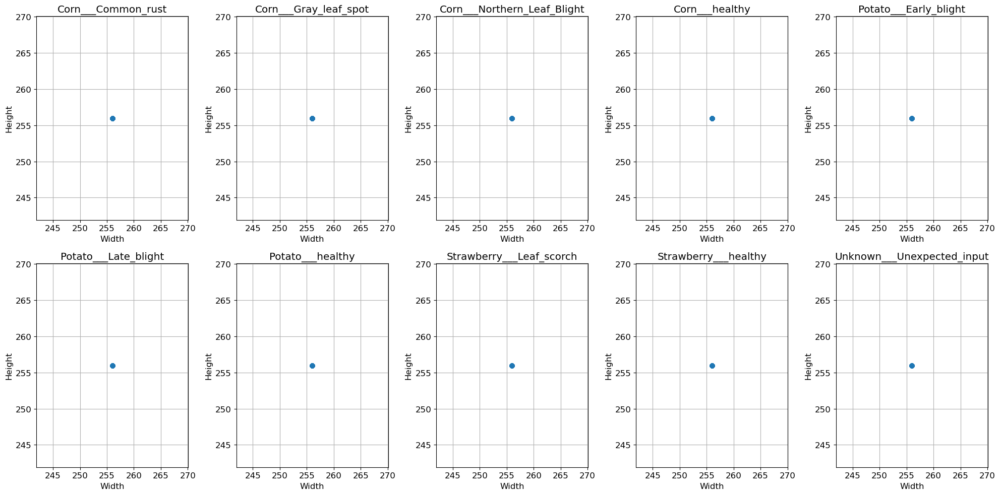

In [10]:
def plot_image_dimensions(dataset, class_names):
    # Set up figure and axes
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))
    axes = axes.flatten()  # Flatten the axes array for easier iteration

    # Dictionary to store dimensions
    dimeImage Dimensions¶
def plot_image_dimensions(dataset, class_names):
    # Set up figure and axes
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))
    axes = axes.flatten()  # Flatten the axes array for easier iteration
​
    # Dictionary to store dimensions
    dimensions = {name: {'width': [], 'height': []} for name in class_names}
​
    # Gather dimensions
    for insions = {name: {'width': [], 'height': []} for name in class_names}

    # Gather dimensions
    for images, labels in dataset.as_numpy_iterator():
        for image, label in zip(images, labels):
            h, w, _ = image.shape  # Get height and width of each image
            class_label = class_names[label]
            dimensions[class_label]['width'].append(w)
            dimensions[class_label]['height'].append(h)

    # Plot dimensions for each class
    for ax, class_name in zip(axes, class_names):
        ax.scatter(dimensions[class_name]['width'], dimensions[class_name]['height'], alpha=0.6)
        ax.set_title(f'{class_name}')
        ax.set_xlabel('Width')
        ax.set_ylabel('Height')
        ax.grid(True)

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage
plot_image_dimensions(dataset, class_names)


### Calculate the Number of Batches

In [11]:
# gets the total number of batches in the dataset
len(dataset)

313

This line calculates the number of batches per epoch based on the dataset size and BATCH_SIZE.

In [12]:
# This loop will print the shape of the images and labels in the first batch
for image_batch, label_batch in dataset.take(1):
    print(image_batch.shape)  # Shape of the images in the batch (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
    print(label_batch.numpy())  # Labels as numpy array

(32, 256, 256, 3)
[7 9 9 3 6 2 8 2 1 0 6 4 2 4 9 3 7 8 0 2 2 5 6 7 7 3 9 5 3 0 8 2]


Here, the script takes one batch from the dataset and prints the shape of the images in the batch and the corresponding labels (as numpy arrays).

### Explore a Single Image from a Batch

In [13]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0].shape) # Shape of the first image in the batch
    #print(image_batch[0].numpy())
    #print(image_batch[0])

(256, 256, 3)


### Displaying a Single Image from a Batch

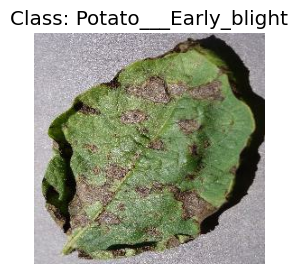

In [14]:
# Plot the first image of the first batch
for image_batch, label_batch in dataset.take(1):
    plt.figure(figsize=(3, 3))
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(f'Class: {class_names[label_batch[0]]}')
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()

### Displaying a Grid of Images from a Batch

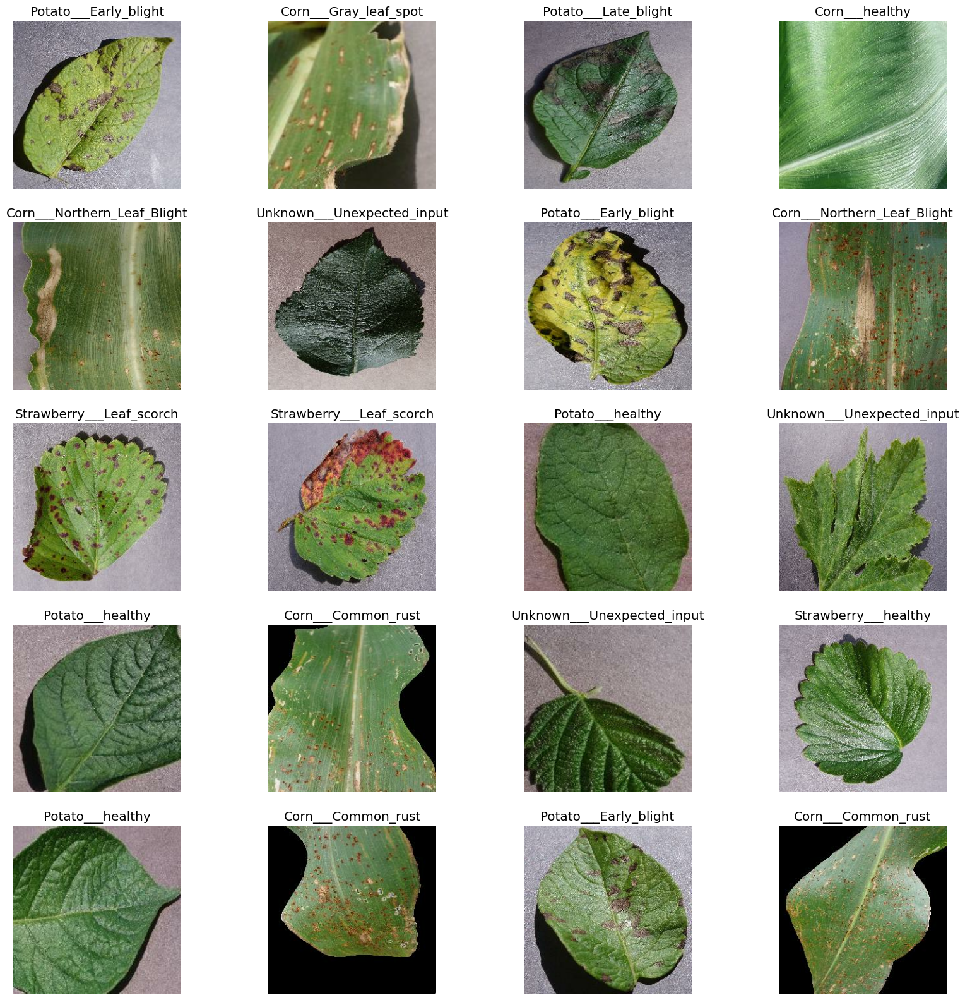

In [15]:
# Displaying a grid of images from a batch
plt.figure(figsize=(20, 20))  # Set the size of the figure
for image_batch, labels_batch in dataset.take(1):
    for i in range(20):  # Assuming want to display 12 images
        ax = plt.subplot(5, 4, i + 1)  # Create a subplot for each image
        plt.imshow(image_batch[i].numpy().astype("uint8"))  # Display the image
        plt.title(class_names[labels_batch[i]])  # Set the title to the corresponding class name
        plt.axis("off")  # Turn off the axis
plt.show()

- This is an effective way to get a quick visual insight into the variety and quality of images in model will be trained on. It also ensures that the dataset is being loaded and processed correctly. Displaying the class labels above each image helps in verifying that the labels are correctly assigned.

### Isolate and Display RGB Channels in Original Colors

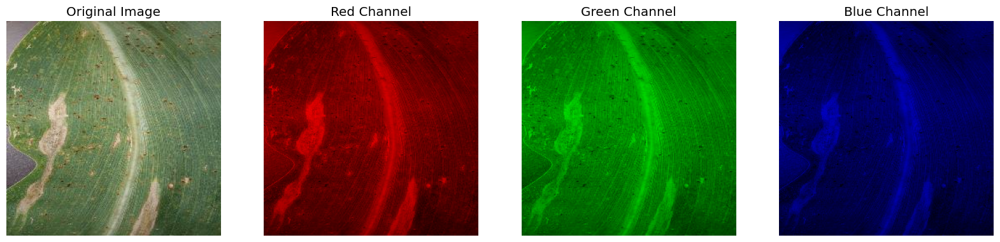

In [16]:
# Take one batch and one image from the dataset
for image_batch, label_batch in dataset.take(1):
    image = image_batch[0].numpy().astype("uint8")  # Convert the first image to uint8 type
    break  # Only take the first image for demonstration

# Split the image into color channels
red_channel = image.copy()
green_channel = image.copy()
blue_channel = image.copy()

# Zero out other channels
# Red channel means Green and Blue set to 0
red_channel[:, :, 1] = 0
red_channel[:, :, 2] = 0

# Green channel means Red and Blue set to 0
green_channel[:, :, 0] = 0
green_channel[:, :, 2] = 0

# Blue channel means Red and Green set to 0
blue_channel[:, :, 0] = 0
blue_channel[:, :, 1] = 0

# Plotting each color channel
plt.figure(figsize=(20, 5))  # Adjust the figure size to accommodate a single row

# Display original image
ax = plt.subplot(1, 4, 1)  # Change subplot grid definition to 1 row, 4 columns, 1st slot
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")

# Display red channel
ax = plt.subplot(1, 4, 2)  # 1 row, 4 columns, 2nd slot
plt.imshow(red_channel)
plt.title("Red Channel")
plt.axis("off")

# Display green channel
ax = plt.subplot(1, 4, 3)  # 1 row, 4 columns, 3rd slot
plt.imshow(green_channel)
plt.title("Green Channel")
plt.axis("off")

# Display blue channel
ax = plt.subplot(1, 4, 4)  # 1 row, 4 columns, 4th slot
plt.imshow(blue_channel)
plt.title("Blue Channel")
plt.axis("off")

plt.show()


- Displays the RGB color channels of an image. This visualization can be very useful for understanding how much each channel contributes to the overall image. Such insights might be useful when deciding on data preprocessing or augmentation techniques, especially in scenarios where color plays a significant role in classification accuracy.

### Display RGB Channels in Grayscale

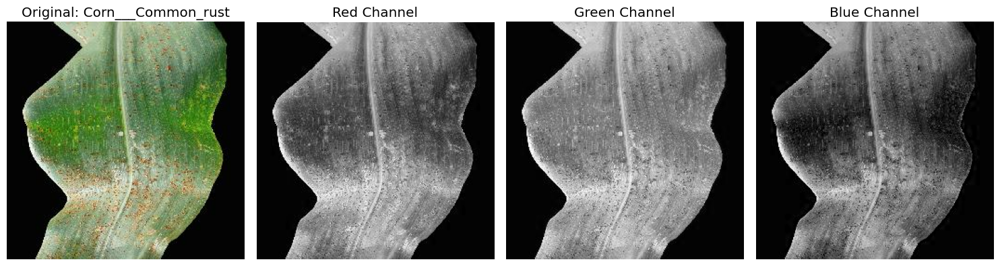

In [17]:
# Dataset and class_names are already defined
def display_image_channels(dataset, class_names):
    # Retrieve a single batch of images and labels
    for image_batch, labels_batch in dataset.take(1):
        # Select the first image from the batch
        image = image_batch[0]

        # Split the image into its Red, Green, and Blue channels
        red_channel = image[:, :, 0]
        green_channel = image[:, :, 1]
        blue_channel = image[:, :, 2]

        # Create a figure to display the channels
        plt.figure(figsize=(15, 5))

        # Display the original image
        plt.subplot(1, 4, 1)
        plt.imshow(image.numpy().astype("uint8"))
        plt.title(f"Original: {class_names[labels_batch[0]]}")
        plt.axis("off")

        # Display the Red channel
        plt.subplot(1, 4, 2)
        plt.imshow(red_channel, cmap="gray")
        plt.title("Red Channel")
        plt.axis("off")

        # Display the Green channel
        plt.subplot(1, 4, 3)
        plt.imshow(green_channel, cmap="gray")
        plt.title("Green Channel")
        plt.axis("off")

        # Display the Blue channel
        plt.subplot(1, 4, 4)
        plt.imshow(blue_channel, cmap="gray")
        plt.title("Blue Channel")
        plt.axis("off")

        # Show the plot
        plt.tight_layout()
        plt.show()

# Call the function
display_image_channels(dataset, class_names)


- Display each RGB channel in grayscale. This approach is particularly useful for highlighting the intensity distribution within each channel, which can be crucial for tasks that may rely heavily on color-based features, such as plant disease identification where color changes in leaves are a key indicator.

### Edge Detection Using the Sobel Operator

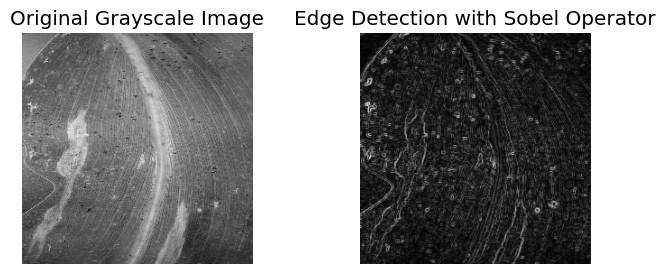

In [18]:
# Let's convert the image to grayscale for edge detection
gray_image = np.dot(image[...,:3], [0.2989, 0.5870, 0.1140])

# Define Sobel kernels for horizontal and vertical gradients
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])
sobel_y = np.array([[-1, -2, -1],
                    [0,  0,  0],
                    [1,  2,  1]])

# Perform convolution using the convolve2d function from scipy
from scipy.signal import convolve2d
grad_x = convolve2d(gray_image, sobel_x, mode='same', boundary='symm')
grad_y = convolve2d(gray_image, sobel_y, mode='same', boundary='symm')

# Calculate the gradient magnitude
grad_magnitude = np.sqrt(grad_x**2 + grad_y**2)

# Normalize to the range [0, 255]
grad_magnitude = (grad_magnitude / np.max(grad_magnitude) * 255).astype(np.uint8)

# Plotting
plt.figure(figsize=(8, 3))

# Display original grayscale image
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Grayscale Image")
plt.axis("off")

# Display edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(grad_magnitude, cmap='gray')
plt.title("Edge Detection with Sobel Operator")
plt.axis("off")

plt.show()


Designed to split a dataset into training, validation, and testing sets according to specified proportions:
- 80% for training,
- 10% for validation, and
- 10% for testing.

The dataset is a collection of batches of data, and using the `take` and `skip` methods provided by TensorFlow to perform the split based on batch counts

In [19]:
# setting aside 80% of the data for training
train_size = 0.8
len(dataset)*train_size

250.4

In [20]:
# taking the first 250 batches for the training set
train_ds = dataset.take(250)
len(train_ds)

250

In [21]:
# After assigning 250 batches to training,
# skipping these 250 batches to create a dataset for validation and testing.
test_ds = dataset.skip(250)
len(test_ds)

63

In [22]:
# setting aside 10% of the data for validation
val_size=0.1
# calculates the number of batches to be used for the validation set
len(dataset)*val_size

31.3

In [23]:
# From the remaining batches, taking 31 for the validation set
val_ds = test_ds.take(31)
len(val_ds)

31

In [24]:
# skipping the 31 batches just assigned to validation to create a test dataset with the remaining batches
test_ds = test_ds.skip(31)
#  number of batches in the test dataset
len(test_ds)

32

In [25]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + val_split + test_split) == 1, "Splits must sum to 1"

    ds_size = len(ds)
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=123)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    test_size = int(test_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size + val_size)

    # Ensure that the test dataset includes any remaining data points that may not have been perfectly divisible
    return train_ds, val_ds, test_ds


- shuffle: A boolean that determines whether to shuffle the dataset or not.
- shuffle_size: The size of the buffer for shuffling the data. Larger buffer sizes allow for better randomization but use more memory.

In [26]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

 - `get_dataset_partitions_tf` function with the dataset, retrieve the individual partitions, and then use the `len()` function to determine the size of each partition in terms of the number of batches.

In [27]:
# Outputs to verify the partitions
print(f"Training batches: {len(train_ds)}")   # Output the number of training batches
print(f"Validation batches: {len(val_ds)}")  # Output the number of validation batches
print(f"Testing batches: {len(test_ds)}")    # Output the number of testing batches

Training batches: 250
Validation batches: 31
Testing batches: 32


### Data Preprocessing Techniques

In [28]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)  # Removed shuffle
test_ds = test_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)  # Removed shuffle


What each method does:

- cache(): This method caches the dataset in memory. By caching, the images do not have to be reloaded from disk during each epoch of training, which can save a significant amount of time, especially when the dataset is large.
- shuffle(1000): This method randomly shuffles the input data. It uses a buffer of size 1000, which means that it will hold 1000 elements in a buffer and randomly sample from that buffer. This helps to ensure that the model does not see the same sequence of images during training, which can be important for preventing the model from memorizing the order of the data (a form of overfitting). A shuffle buffer size should be large enough to provide good randomization but small enough not to consume too much memory.
- prefetch(buffer_size=tf.data.AUTOTUNE): This method allows the input pipeline to asynchronously fetch batches while your model is training. The AUTOTUNE buffer size allows TensorFlow to automatically manage the amount of data to prefetch based on available system resources, effectively reducing idle time on the GPU or other processing hardware during training.

### Resizing and Rescaling

In [29]:
resize_and_rescale = tf.keras.Sequential([
  tf.keras.layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  tf.keras.layers.Rescaling(1.0/255)
])

- This layer rescales the pixel values of the images from the range [0, 255] (typical for images) to [0, 1]. This normalization can help with the convergence of the model during training by standardizing the range of the input data.

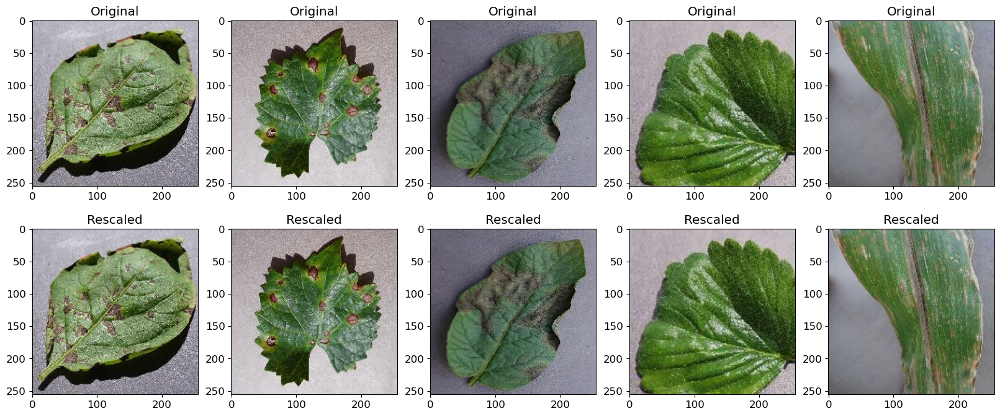

In [30]:
def display_rescaled_images(original_images, rescaled_images, n_examples=5):
    """
    Display a comparison of original and rescaled images.
    """
    plt.figure(figsize=(n_examples * 4, 8))
    for i in range(n_examples):
        # Display original image
        ax = plt.subplot(2, n_examples, i + 1)
        plt.imshow(original_images[i].numpy().astype("uint8"))
        plt.title("Original")
        plt.axis()

        # Display rescaled image
        ax = plt.subplot(2, n_examples, i + 1 + n_examples)
        plt.imshow(rescaled_images[i].numpy())
        plt.title("Rescaled")
        plt.axis()
    plt.show()

# Load a batch of images and apply resizing and rescaling
for images, _ in train_ds.take(1):  # Taking one batch from the training dataset
    rescaled_images = resize_and_rescale(images)  # Apply resizing and rescaling
    display_rescaled_images(images, rescaled_images)  # Display examples


- There may not be a visible difference between the original and rescaled images. This is expected because rescaling the pixel values from a range of [0, 255] to [0, 1] doesn't change the way the image is displayed.

- The rescaling is essential for the neural network to process the input data more effectively, as networks typically perform better with smaller input values.

### Data Augmentation

In [31]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),  # for flipping images horizontally and vertically
    layers.RandomRotation(0.2),  # for rotating images by ±20% of 360 degrees
    layers.RandomZoom(0.2),  # zoom in or out by 20%
    layers.RandomTranslation(height_factor=0.2, width_factor=0.2),  # for width and height shifts
    layers.RandomContrast(0.2),  # randomly change image contrast
])


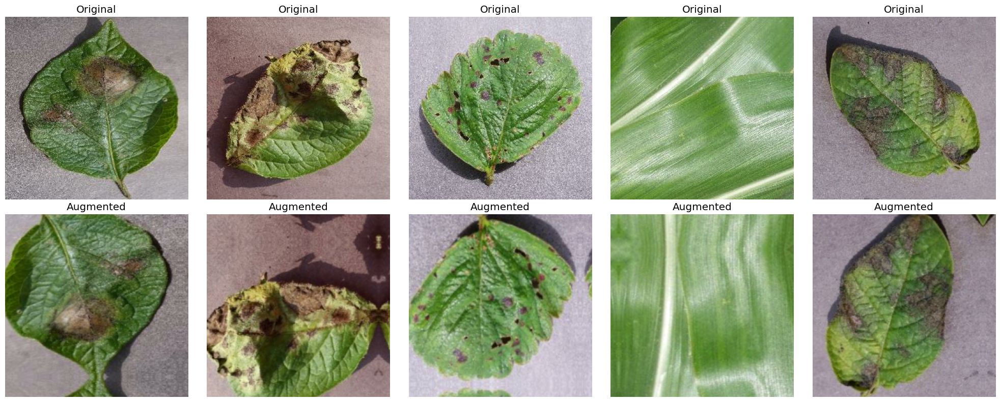

In [32]:
def display_examples(original_images, augmented_images, n_examples=5):
    """
    Display a comparison of original and augmented images.
    """
    plt.figure(figsize=(n_examples * 4, 8))  # Adjust the figure size to give each image enough space
    for i in range(n_examples):
        # Display original image
        ax = plt.subplot(2, n_examples, i + 1)
        plt.imshow(original_images[i].numpy().astype("uint8"))
        plt.title("Original")
        plt.axis("off")

        # Display augmented image
        ax = plt.subplot(2, n_examples, i + 1 + n_examples)
        plt.imshow(augmented_images[i].numpy().astype("uint8"))
        plt.title("Augmented")
        plt.axis("off")
    plt.tight_layout()  # Adjust the layout so titles and images don't overlap
    plt.show()

# Make sure the data_augmentation layer is in 'training' mode to apply augmentations
for images, _ in train_ds.take(1):  # Taking one batch from the training dataset
    augmented_images = data_augmentation(images, training=True)  # Apply augmentation with training=True
    display_examples(images, augmented_images)  # Display examples


- Image showing original and augmented pictures of plant leaves, which could be part of the process of confirming the data augmentation step in machine learning pipeline. From the image, it's visible that the augmentation includes variations like flips and rotations, introducing the intended variability to the dataset.

### Model Architecture

In [33]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes =10

# Define the sequential model
model = models.Sequential([
    layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    
    # Resizing and rescaling layer, Data augmentation
    resize_and_rescale, 
    #data_augmentation,

    # First Convolution Block
    layers.Conv2D(32, kernel_size=(3,3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    # Second Convolution Block
    layers.Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    # Third Convolution Block
    layers.Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    # Fourth Convolution Block
    layers.Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    # Fifth Convolution Block
    layers.Conv2D(64, kernel_size=(3,3), padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    # Flattening the outputs of the last pooling layer to feed into the dense layers
    layers.Flatten(),

    # Dense Layers
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax')
])


In [34]:
#model.build(input_shape)

In [35]:
# Model is already defined as 'model'
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 256, 256, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │         262,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 393,034 (1.50 MB)

 Trainable params: 393,034 (1.50 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
# Generate a list of layer names
model_layers = [layer.name for layer in model.layers]
for index, layer_name in enumerate(model_layers):
    print(f'Layer {index}: {layer_name}')


Layer 0: sequential
Layer 1: conv2d
Layer 2: max_pooling2d
Layer 3: conv2d_1
Layer 4: max_pooling2d_1
Layer 5: conv2d_2
Layer 6: max_pooling2d_2
Layer 7: conv2d_3
Layer 8: max_pooling2d_3
Layer 9: conv2d_4
Layer 10: max_pooling2d_4
Layer 11: flatten
Layer 12: dense
Layer 13: dense_1


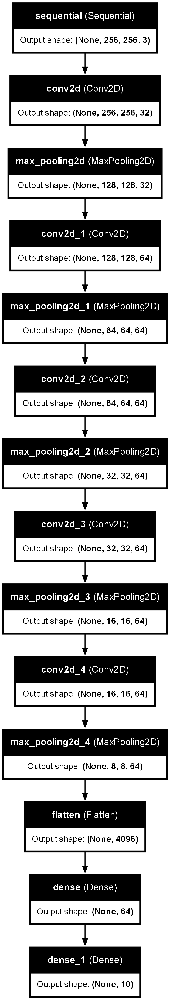

In [37]:
# Plot the model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)


### Callbacks Setup

In [38]:
# Setup callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',    # Monitor the validation loss
    patience=5,            # Number of epochs with no improvement after which training will be stopped
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    "C:/Users/Sulani/Jupyter notebooks/plant-disease/training/saved_models/best_model1_1.keras",
    monitor='val_loss',
    save_best_only=True,  # Only save the model if 'val_loss' has improved
    verbose=1
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=3,
    verbose=1
)

tensorboard = TensorBoard(log_dir='./logs')


### Class Weights Calculation

In [39]:
# Extract labels for batched dataset
#y_train = []
#for _, y in train_ds.unbatch():
    # Append each label to the list, converting it to a Python scalar if necessary
#    y_train.append(y.numpy().item())  # Use item() to extract a single scalar value from a 0-d array
#y_train = np.array(y_train)

#class_weights = compute_class_weight(
#    class_weight='balanced',
#    classes=np.unique(y_train),
#    y=y_train
#)
#class_weights = dict(enumerate(class_weights))


### Model Compilation

In [40]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

- Adam optimizer, which is a popular choice due to its efficiency and adaptive learning rate properties. The loss function is set to - - SparseCategoricalCrossentropy, which is suitable for multi-class classification problems where the classes are represented as integers
- The from_logits=False parameter indicates that the output of your model is expected to be probabilities from a softmax activation

### Model Training

In [41]:
# Add ModelCheckpoint to callbacks
callbacks = [early_stopping, model_checkpoint, reduce_lr, tensorboard]


# Fit the model
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    verbose=1,
    #class_weight=class_weights,
    callbacks=callbacks  
)

Epoch 1/40
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step - accuracy: 0.3163 - loss: 1.8541
Epoch 1: val_loss improved from inf to 0.97344, saving model to C:/Users/Sulani/Jupyter notebooks/plant-disease/training/saved_models/best_model1_1.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 123s 481ms/step - accuracy: 0.3169 - loss: 1.8525 - val_accuracy: 0.6714 - val_loss: 0.9734 - learning_rate: 0.0010
Epoch 2/40
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - accuracy: 0.7218 - loss: 0.7745
Epoch 2: val_loss improved from 0.97344 to 0.40603, saving model to C:/Users/Sulani/Jupyter notebooks/plant-disease/training/saved_models/best_model1_1.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 119s 477ms/step - accuracy: 0.7220 - loss: 0.7741 - val_accuracy: 0.8599 - val_loss: 0.4060 - learning_rate: 0.0010
Epoch 3/40
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step - accuracy: 0.8565 - loss: 0.4122
Epoch 3: val_loss improved from 0.40603 to 0.38248, saving model to C:/Users/Sulani/Jupyter notebooks/plant-disease/training/saved_mod

In [42]:
# Load the TensorBoard notebook extension
#%reload_ext tensorboard

# Start TensorBoard
#%tensorboard --logdir=./logs --port=6010

### Evaluating the Model on the Test Dataset

In [43]:
# Evaluate the model on the test dataset
scores = model.evaluate(test_ds)
print("Test loss:", scores[0])
print("Test accuracy:", scores[1])


32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - accuracy: 0.9807 - loss: 0.0926
Test loss: 0.09153202921152115
Test accuracy: 0.9833984375


In [44]:
# Evaluate the model on the validation dataset
val_scores = model.evaluate(val_ds)
print("Validation loss:", val_scores[0])
print("Validation accuracy:", val_scores[1])


31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - accuracy: 0.9856 - loss: 0.0554
Validation loss: 0.051660872995853424
Validation accuracy: 0.9858871102333069


### Accessing Training History

In [45]:
history

In [46]:
history.params

{'verbose': 1, 'epochs': 40, 'steps': 250}

- This attribute of the history object contains the parameters used for model training, such as batch size, number of epochs, and validation data

In [47]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss', 'learning_rate'])

- These keys correspond to the different metrics recorded during training, such as 'loss', 'accuracy', 'val_loss', 'val_accuracy'.

In [48]:
type(history.history['loss'])

list

- This checks the data type of the loss values recorded during training. It likely returns a list

In [49]:
len(history.history['loss'])

30

- This returns the number of epochs recorded in the training history, indicating the length of the loss history.

In [50]:
history.history['loss'][:5] # show loss for first 5 epochs

[1.4664093255996704,
 0.6780243515968323,
 0.3979730010032654,
 0.3151850402355194,
 0.22639919817447662]

- As training progresses, the loss value ideally decreases, indicating that the model is learning to make better predictions.

### Extracting Training History

In [51]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

### Plotting Training and Validation Accuracy

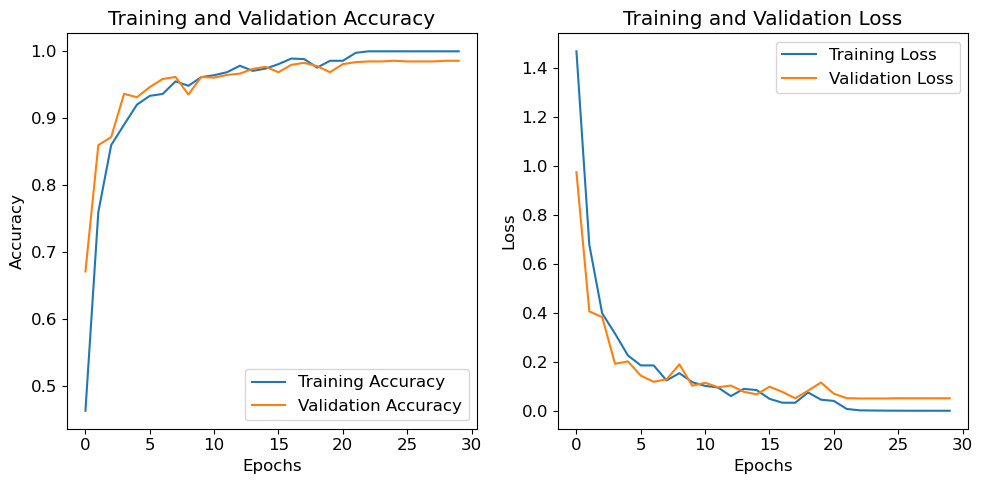

In [52]:
# Plotting Training and Validation Accuracy and Loss
plt.figure(figsize=(10, 5))

# Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

# Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


### Making Predictions on a Single Image

First image to predict:


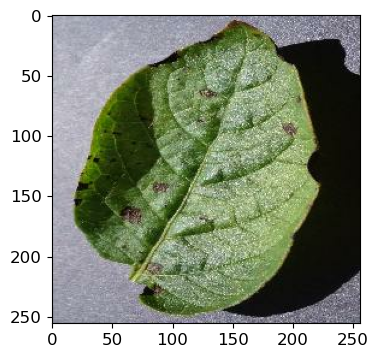

Actual label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
Predicted label: Potato___Early_blight


In [53]:
plt.figure(figsize=(4, 4))
# Loop through one batch from the test dataset
for images_batch, labels_batch in test_ds.take(1):
    # Extract the first image from the batch and convert to uint8 type
    first_image = images_batch[0].numpy().astype('uint8')
    # Extract the first label corresponding to the first image
    first_label = labels_batch[0].numpy()

    # Display the first image
    print("First image to predict:")
    plt.imshow(first_image)
    plt.show()
    # Print the actual label using class names mapping
    print("Actual label:", class_names[first_label])

    # Predict the entire batch using the trained model
    batch_prediction = model.predict(images_batch)
    # Display the predicted label for the first image
    print("Predicted label:", class_names[np.argmax(batch_prediction[0])])


- This section of the code takes the first batch of images from the test dataset, extracts the first image and its corresponding label, displays the image, predicts its label using the trained model, and prints the actual and predicted labels.

### Prediction Function for Single Image

In [54]:
# Define a prediction function
def predict(model, img):
    # Convert the image to an array format suitable for the model
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    # Add a batch dimension to the image array for model prediction
    img_array = tf.expand_dims(img_array, 0)

    # Use the model to predict the image's class
    predictions = model.predict(img_array)

    # Determine the class with the highest prediction probability
    predicted_class = class_names[np.argmax(predictions[0])]
    # Calculate the confidence of the prediction
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence


- The function called predict() that takes a model and an image as input. It converts the image to a NumPy array, expands its dimensions, uses the model to predict the class probabilities, and returns the predicted class and confidence.

### Prediction Results for a Single Batch of Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


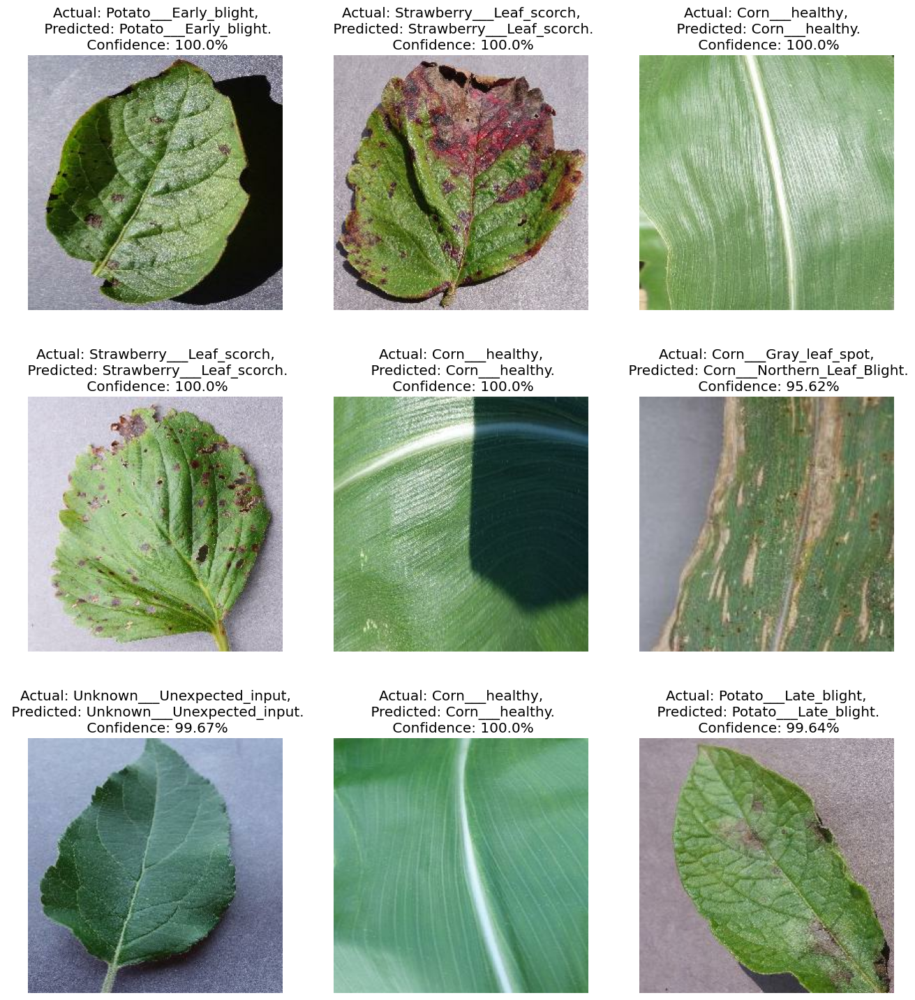

In [55]:
# Set up the figure size for displaying images
plt.figure(figsize=(16, 18))
# Loop through 1 batch from the test dataset
for images, labels in test_ds.take(1):
    # Display the first 9 images in a 3x3 grid
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        # Use the predict function to predict the class and confidence
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        # Set the title of each subplot to show actual and predicted classes and confidence
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")


### Comparative Prediction Analysis Across Three Batches

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


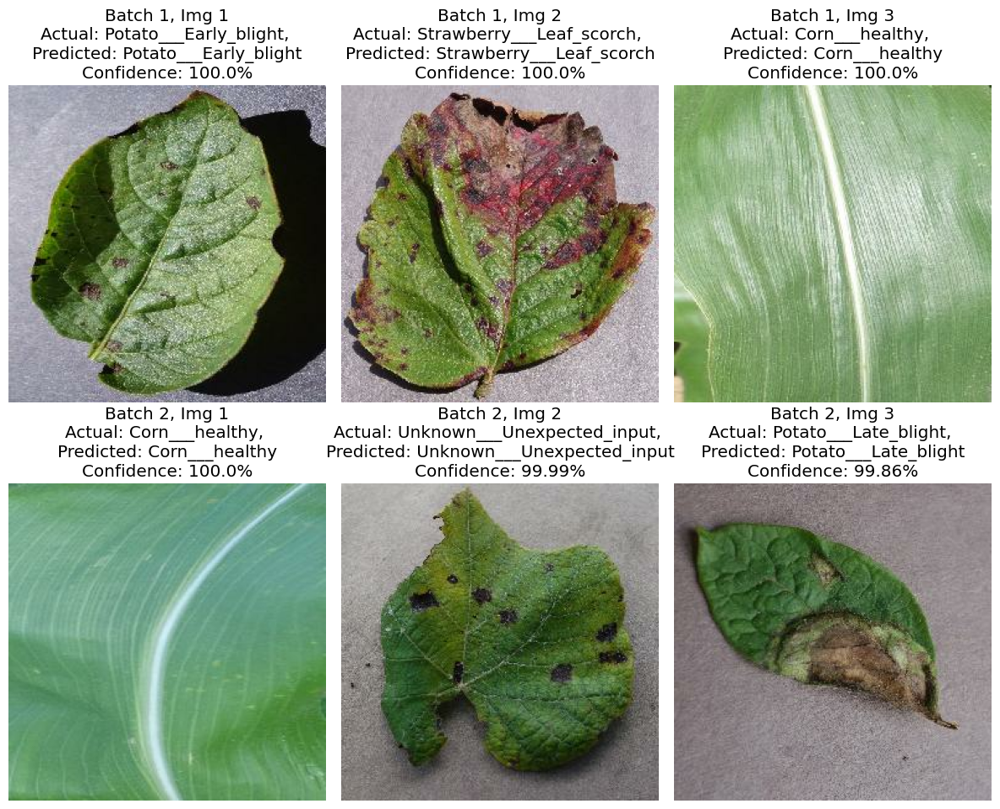

In [76]:
# Set up the figure size for displaying images
plt.figure(figsize=(12, 10))  

# Loop through the first 2 batches from the test dataset
for batch_index, (images, labels) in enumerate(test_ds.take(2)):
    # Loop through the first 3 images in each batch
    for img_index in range(3):
        # Select the image and label
        image = images[img_index]
        label = labels[img_index]

        # Display the image
        ax = plt.subplot(2, 3, batch_index * 3 + img_index + 1)  # Calculate position index in a 3x3 grid
        plt.imshow(image.numpy().astype("uint8"))

        # Use the prediction function to get the class and confidence
        predicted_class, confidence = predict(model, image.numpy())
        actual_class = class_names[label.numpy()]  # Converting label to actual class name

        # Set the title of each subplot to show actual and predicted classes and confidence
        plt.title(f"Batch {batch_index+1}, Img {img_index+1}\nActual: {actual_class}, \nPredicted: {predicted_class}\nConfidence: {confidence}%")
        plt.axis("off")

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


-  Visualizes predictions on a batch of images from the test dataset. It iterates through the images in the batch, calls the predict() function to get the predicted class and confidence, and plots each image along with its actual label, predicted label, and confidence level.

### Classification Report

In [57]:
y_true = []
y_pred = []

# Iterate over the unbatched test dataset
for image, label in test_ds.unbatch():
    # The model expects a batch dimension, so use np.expand_dims to add it
    image = np.expand_dims(image.numpy(), axis=0)

    # Predict the image quietly
    pred = model.predict(image, verbose=0)  # Set verbose to 0 to disable logging

    # Convert the prediction to a class index
    pred_class = np.argmax(pred, axis=1)

    # Append the true label and the predicted class to the respective lists
    y_true.append(label.numpy())
    y_pred.append(pred_class[0])

# Generate the classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print(report)


                             precision    recall  f1-score   support

         Corn___Common_rust       1.00      1.00      1.00       103
      Corn___Gray_leaf_spot       0.95      0.96      0.95        97
Corn___Northern_Leaf_Blight       0.96      0.96      0.96        94
             Corn___healthy       1.00      1.00      1.00       111
      Potato___Early_blight       0.99      1.00      1.00       103
       Potato___Late_blight       1.00      0.98      0.99       107
           Potato___healthy       0.98      0.99      0.98        92
   Strawberry___Leaf_scorch       0.98      1.00      0.99       113
       Strawberry___healthy       1.00      1.00      1.00        94
 Unknown___Unexpected_input       0.97      0.95      0.96       110

                   accuracy                           0.98      1024
                  macro avg       0.98      0.98      0.98      1024
               weighted avg       0.98      0.98      0.98      1024



### Plotting the Confusion Matrix

In [58]:
# Generate the confusion matrix
cm = confusion_matrix(y_true, y_pred)
print(cm)

[[103   0   0   0   0   0   0   0   0   0]
 [  0  93   3   0   0   0   0   1   0   0]
 [  0   3  90   0   0   0   0   1   0   0]
 [  0   0   0 111   0   0   0   0   0   0]
 [  0   0   0   0 103   0   0   0   0   0]
 [  0   0   0   0   0 105   0   0   0   2]
 [  0   0   0   0   0   0  91   0   0   1]
 [  0   0   0   0   0   0   0 113   0   0]
 [  0   0   0   0   0   0   0   0  94   0]
 [  0   2   1   0   1   0   2   0   0 104]]


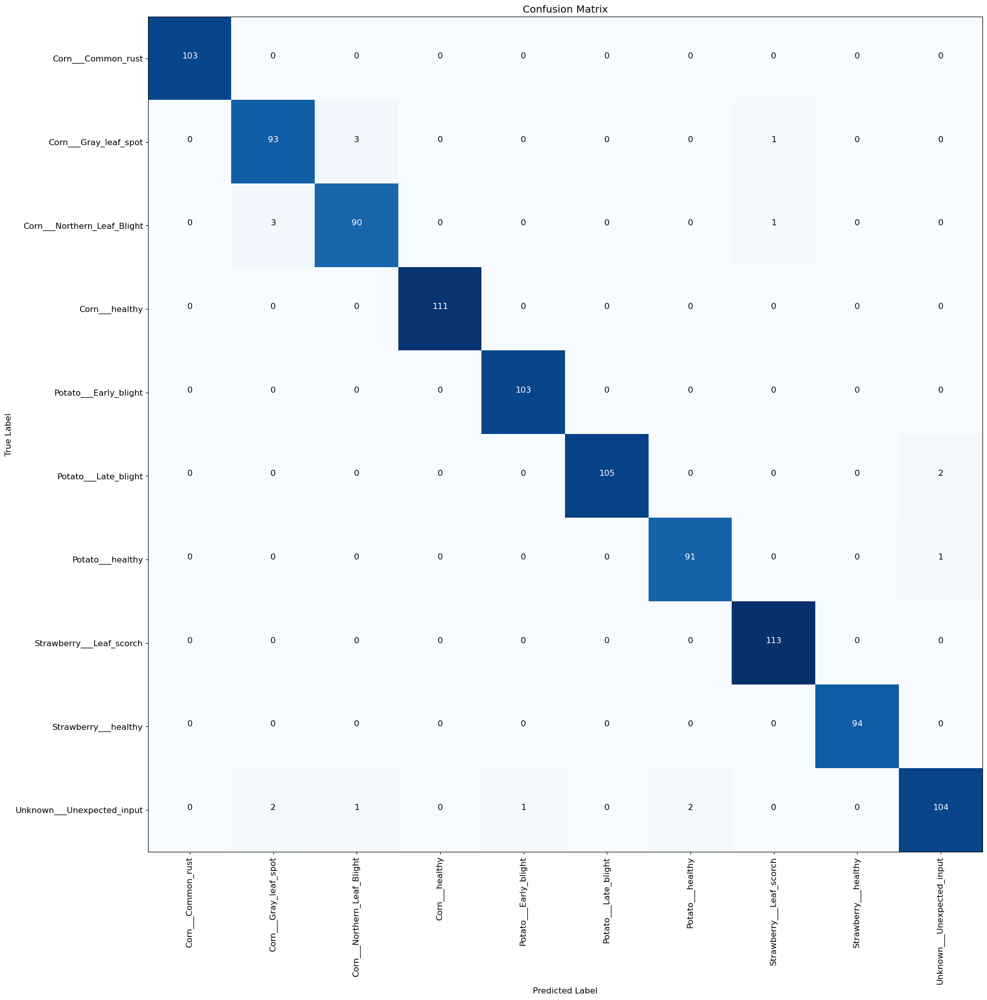

In [59]:
# Generate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Define the size of the figure
plt.figure(figsize=(20, 20))

# Plot the confusion matrix
cmap = plt.cm.Blues  # Define the color map
plt.imshow(cm, interpolation='nearest', cmap=cmap)

# Add title and axis labels
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

# Add tick marks and set class names as labels
plt.xticks(np.arange(len(class_names)), class_names, rotation=90)
plt.yticks(np.arange(len(class_names)), class_names)

# Add annotations
thresh = cm.max() / 2.  # Threshold for text color contrast
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        color = "white" if cm[i, j] > thresh else "black"
        plt.text(j, i, format(cm[i, j], 'd'), horizontalalignment="center", color=color)

# Avoid matplotlib warning
plt.tight_layout()

# Show the plot
plt.show()


### Plotting the ROC Curves

In [60]:
y_true = []
test_images = []

for images, labels in test_ds:
    y_true.append(labels.numpy())
    test_images.append(images.numpy())

y_true = np.concatenate(y_true, axis=0)
test_images = np.concatenate(test_images, axis=0)

y_pred_probs = model.predict(test_images)

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step


In [61]:
# Define the number of classes
n_classes = 10  
y_true_binary = label_binarize(y_true, classes=range(n_classes))

print("Shape of true labels:", y_true_binary.shape)
print("Shape of predicted probabilities:", y_pred_probs.shape)


Shape of true labels: (1024, 10)
Shape of predicted probabilities: (1024, 10)


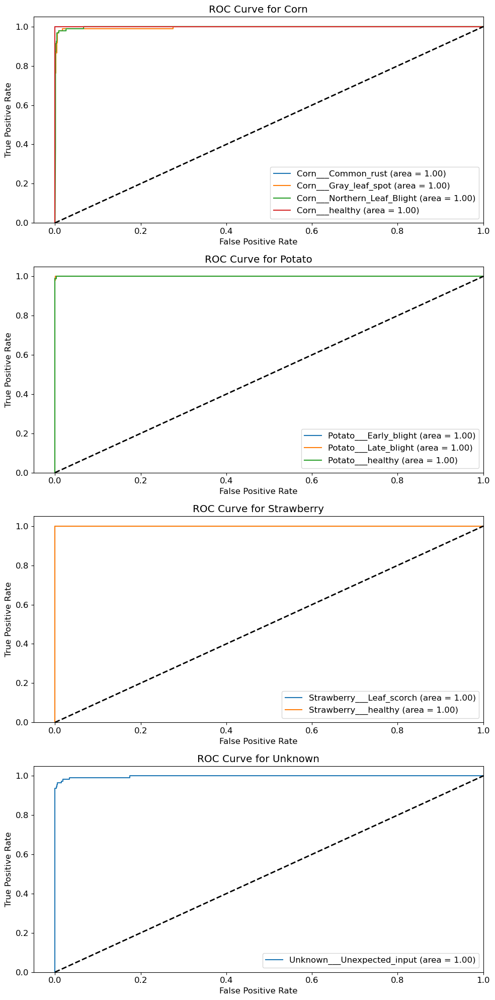

In [81]:
# Class and plant type mapping
class_names = ['Corn___Common_rust', 'Corn___Gray_leaf_spot', 'Corn___Northern_Leaf_Blight', 'Corn___healthy', 
               'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Strawberry___Leaf_scorch', 
               'Strawberry___healthy', 'Unknown___Unexpected_input']

class_types = ['Corn', 'Potato', 'Strawberry', 'Unknown']

# Collect indices for each plant type
class_type_indices = {
    plant: [i for i, name in enumerate(class_names) if name.startswith(plant)]
    for plant in class_types
}

# Plot ROC curve for each class type in a 4x1 layout
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(10, 20))  # Adjust figsize to fit your preferences

for ax, plant in zip(axes, class_types):
    indices = class_type_indices[plant]
    for index in indices:
        fpr, tpr, _ = roc_curve(y_true_binary[:, index], y_pred_probs[:, index])
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, label=f'{class_names[index]} (area = {roc_auc:.2f})')
    
    ax.plot([0, 1], [0, 1], 'k--', lw=2)  # Add a diagonal line to indicate random chance directly to the ax
    ax.set_xlim([-0.05, 1.0])  # Set x-axis limit
    ax.set_ylim([0.0, 1.05])  # Set y-axis limit
    ax.set_title(f'ROC Curve for {plant}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(loc="lower right")

plt.tight_layout()
plt.show()
